In [5]:

import numpy as np
from numpy.random import seed
import pandas as pd
from pandas import read_excel, DataFrame, Series
import matplotlib.pyplot as plt
import seaborn as sb
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler

import plotly.express as px
from joblib import dump, load
from scipy import stats


In [6]:
#путь к файлу с Ds1

In [7]:
X_bp_xlsx = 'C:/ESD/X_bp.xlsx'

In [8]:
#Загрузка Dataset1: "X_bp.xlsx"

In [9]:
X_bp = pd.read_excel(X_bp_xlsx, engine = 'openpyxl')

In [10]:
#Проверка размерности

In [11]:
X_bp.shape

(1023, 11)

In [12]:
# Вывод первых 5 строк данных

In [13]:
print(X_bp.head())

   Unnamed: 0  Соотношение матрица-наполнитель  Плотность, кг/м3  \
0           0                         1.857143            2030.0   
1           1                         1.857143            2030.0   
2           2                         1.857143            2030.0   
3           3                         1.857143            2030.0   
4           4                         2.771331            2030.0   

   модуль упругости, ГПа  Количество отвердителя, м.%  \
0             738.736842                        30.00   
1             738.736842                        50.00   
2             738.736842                        49.90   
3             738.736842                       129.00   
4             753.000000                       111.86   

   Содержание эпоксидных групп,%_2  Температура вспышки, С_2  \
0                        22.267857                100.000000   
1                        23.750000                284.615385   
2                        33.000000                284.61

In [14]:
X_bp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1023 entries, 0 to 1022
Data columns (total 11 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Unnamed: 0                            1023 non-null   int64  
 1   Соотношение матрица-наполнитель       1023 non-null   float64
 2   Плотность, кг/м3                      1023 non-null   float64
 3   модуль упругости, ГПа                 1023 non-null   float64
 4   Количество отвердителя, м.%           1023 non-null   float64
 5   Содержание эпоксидных групп,%_2       1023 non-null   float64
 6   Температура вспышки, С_2              1023 non-null   float64
 7   Поверхностная плотность, г/м2         1023 non-null   float64
 8   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 9   Прочность при растяжении, МПа         1023 non-null   float64
 10  Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10), i

In [15]:
X_nup_xlsx = 'C:/ESD/X_nup.xlsx'

In [16]:
#Загрузка Dataset2: "X_nup.xlsx"

In [17]:
X_nup = pd.read_excel(X_nup_xlsx, engine = 'openpyxl')

In [18]:
#Проверка размерности

In [19]:
X_nup.shape

(1040, 4)

In [20]:
print(X_nup.head())

   Unnamed: 0  Угол нашивки, град  Шаг нашивки  Плотность нашивки
0           0                   0          4.0               57.0
1           1                   0          4.0               60.0
2           2                   0          4.0               70.0
3           3                   0          5.0               47.0
4           4                   0          5.0               57.0


In [21]:
X_nup.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1040 entries, 0 to 1039
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Unnamed: 0          1040 non-null   int64  
 1   Угол нашивки, град  1040 non-null   int64  
 2   Шаг нашивки         1040 non-null   float64
 3   Плотность нашивки   1040 non-null   float64
dtypes: float64(2), int64(2)
memory usage: 32.6 KB


In [22]:
#удаление столбца - Unnamed: 0. axis=1 - столбец,а  axis=0 означало бы - строку, inplace=True - применение к исходному DS (а не создовало копии DS с удаленным столбцоп)

In [23]:
X_bp.drop(['Unnamed: 0'], axis=1, inplace=True)

In [24]:
# Вывод первых 5 строк данных

In [25]:
X_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [26]:
#удаление столбца - Unnamed: 0.

In [27]:
X_nup.drop(['Unnamed: 0'], axis=1, inplace=True)

In [28]:
# Вывод первых 5 строк данных

In [29]:
X_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.0,57.0
1,0,4.0,60.0
2,0,4.0,70.0
3,0,5.0,47.0
4,0,5.0,57.0


In [30]:
#объединение внутренее('inner') двух DataFrame, заменяем столбцы на индексы строк (left_index = True - в X_br и right_index = True - в X-nup)

In [31]:
DataF = X_bp.merge(X_nup, how = 'inner', left_index = True, right_index = True)
DataF.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [32]:
# вывод первых 5 строк в транспонированном виде

In [33]:
DataF.head().T

,0,1,2,3,4
Соотношение матрица-наполнитель,1.857143,1.857143,1.857143,1.857143,2.771331
"Плотность, кг/м3",2030.000000,2030.000000,2030.000000,2030.000000,2030.000000
"модуль упругости, ГПа",738.736842,738.736842,738.736842,738.736842,753.000000
"Количество отвердителя, м.%",30.000000,50.000000,49.900000,129.000000,111.860000
"Содержание эпоксидных групп,%_2",22.267857,23.750000,33.000000,21.250000,22.267857
"Температура вспышки, С_2",100.000000,284.615385,284.615385,300.000000,284.615385
"Поверхностная плотность, г/м2",210.000000,210.000000,210.000000,210.000000,210.000000
"Модуль упругости при растяжении, ГПа",70.000000,70.000000,70.000000,70.000000,70.000000
"Прочность при растяжении, МПа",3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
"Потребление смолы, г/м2",220.000000,220.000000,220.000000,220.000000,220.000000


In [34]:
#Разведочный Анализ

In [35]:
#вывод информации о DF:тип данных, непустые значения, кол-во используемой памяти

In [36]:
DataF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

In [37]:
# количество уникальныльх значений

In [38]:
DataF.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [39]:
#выбор  и подсчет количества уникальных значениц

In [40]:
DataF.iloc[:,10].nunique()

2

In [41]:
#число элементов где Угол нашивки = 0 

In [42]:
DataF['Угол нашивки, град'][DataF['Угол нашивки, град'] == 0.0].count()

520

In [43]:
#сохранение копии исходных элементов - для дальнейшей проверки после преобразование .replase

In [44]:
DataF1 = DataF.copy()

In [45]:
#замена replase на value. Значения в столбце с именем "Угол нашивки, град" заменяются согласно словарю: 0.0 заменяется на 0, а 90.0 на 1)

In [46]:
DataF1 = DataF1.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}}) 

In [47]:
#количество исходных элементов где угол нашивки равен 0, не изменилось

In [48]:
DataF1['Угол нашивки, град'][DataF1['Угол нашивки, град'] == 0.0].count()

520

In [49]:
 #измениение типа данных столбца с индексом 10 на целочисленный.


In [50]:
DataF1['Угол нашивки, град'] = DataF1['Угол нашивки, град'].astype(int)

Проверка замены

In [52]:
DataF1.iloc[:,10]

0       0
1       0
2       0
3       0
4       0
       ..
1018    1
1019    1
1020    1
1021    1
1022    1
Name: Угол нашивки, град, Length: 1023, dtype: int32

Распределение данных в столбцах:count-кол-во не пустых зн., mean-ср.зн , std-стандартное отклонение, 25%-первый квартиль и пр.

In [54]:
DataF1.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


In [55]:
#обнаружение и подсчет дубликатов

In [56]:
DataF1.duplicated().sum()

0

In [57]:
#обнаружение и подсчет пропусков

In [58]:
DataF1.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [59]:
#коэффициенты корреляции Кендалла для каждой пары столбцов

In [60]:
DataF1.corr(method = 'kendall')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,-0.003135,0.021247,0.001410,0.010180,-0.009480,-0.002060,-0.004157,0.011614,0.035145,-0.021395,0.022723,0.002788
"Плотность, кг/м3",-0.003135,1.000000,-0.008059,-0.021963,-0.007758,-0.019947,0.037302,-0.021151,-0.047426,-0.017079,-0.051525,-0.031220,0.052935
"модуль упругости, ГПа",0.021247,-0.008059,1.000000,0.022382,0.002351,0.021028,-0.000442,0.005458,0.022959,0.005169,-0.031695,-0.008305,0.049347
"Количество отвердителя, м.%",0.001410,-0.021963,0.022382,1.000000,0.000010,0.059034,0.033110,-0.043140,-0.046507,-0.003677,0.024690,0.006232,0.016607
"Содержание эпоксидных групп,%_2",0.010180,-0.007758,0.002351,0.000010,1.000000,-0.002170,-0.006859,0.041994,-0.013441,0.009756,0.004668,-0.004539,-0.021968
"Температура вспышки, С_2",-0.009480,-0.019947,0.021028,0.059034,-0.002170,1.000000,0.017196,0.016481,-0.019106,0.035313,0.017880,0.029552,0.005268
"Поверхностная плотность, г/м2",-0.002060,0.037302,-0.000442,0.033110,-0.006859,0.017196,1.000000,0.024051,-0.005099,-0.004446,0.045452,0.025514,-0.022320
"Модуль упругости при растяжении, ГПа",-0.004157,-0.021151,0.005458,-0.043140,0.041994,0.016481,0.024051,1.000000,-0.006599,0.034814,0.022431,-0.010024,-0.002600
"Прочность при растяжении, МПа",0.011614,-0.047426,0.022959,-0.046507,-0.013441,-0.019106,-0.005099,-0.006599,1.000000,0.013580,0.020609,-0.048049,0.009821
"Потребление смолы, г/м2",0.035145,-0.017079,0.005169,-0.003677,0.009756,0.035313,-0.004446,0.034814,0.013580,1.000000,-0.002402,0.005962,0.010792


In [61]:
#коэффициенты корреляции Пирсона

In [62]:
DataF1.corr(method ='pearson')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.003841,0.031700,-0.006445,0.019766,-0.004776,-0.006272,-0.008411,0.024148,0.072531,-0.031073,0.036437,-0.004652
"Плотность, кг/м3",0.003841,1.000000,-0.009647,-0.035911,-0.008278,-0.020695,0.044930,-0.017602,-0.069981,-0.015937,-0.068474,-0.061015,0.080304
"модуль упругости, ГПа",0.031700,-0.009647,1.000000,0.024049,-0.006804,0.031174,-0.005306,0.023267,0.041868,0.001840,-0.025417,-0.009875,0.056346
"Количество отвердителя, м.%",-0.006445,-0.035911,0.024049,1.000000,-0.000684,0.095193,0.055198,-0.065929,-0.075375,0.007446,0.038570,0.014887,0.017248
"Содержание эпоксидных групп,%_2",0.019766,-0.008278,-0.006804,-0.000684,1.000000,-0.009769,-0.012940,0.056828,-0.023899,0.015165,0.008052,0.003022,-0.039073
"Температура вспышки, С_2",-0.004776,-0.020695,0.031174,0.095193,-0.009769,1.000000,0.020121,0.028414,-0.031763,0.059954,0.020695,0.025795,0.011391
"Поверхностная плотность, г/м2",-0.006272,0.044930,-0.005306,0.055198,-0.012940,0.020121,1.000000,0.036702,-0.003210,0.015692,0.052299,0.038332,-0.049923
"Модуль упругости при растяжении, ГПа",-0.008411,-0.017602,0.023267,-0.065929,0.056828,0.028414,0.036702,1.000000,-0.009009,0.050938,0.023003,-0.029468,0.006476
"Прочность при растяжении, МПа",0.024148,-0.069981,0.041868,-0.075375,-0.023899,-0.031763,-0.003210,-0.009009,1.000000,0.028602,0.023398,-0.059547,0.019604
"Потребление смолы, г/м2",0.072531,-0.015937,0.001840,0.007446,0.015165,0.059954,0.015692,0.050938,0.028602,1.000000,-0.015334,0.013394,0.012239


In [63]:
#Гистограммы распределения 1. Нормальное распределение. Один категориальный параметр.


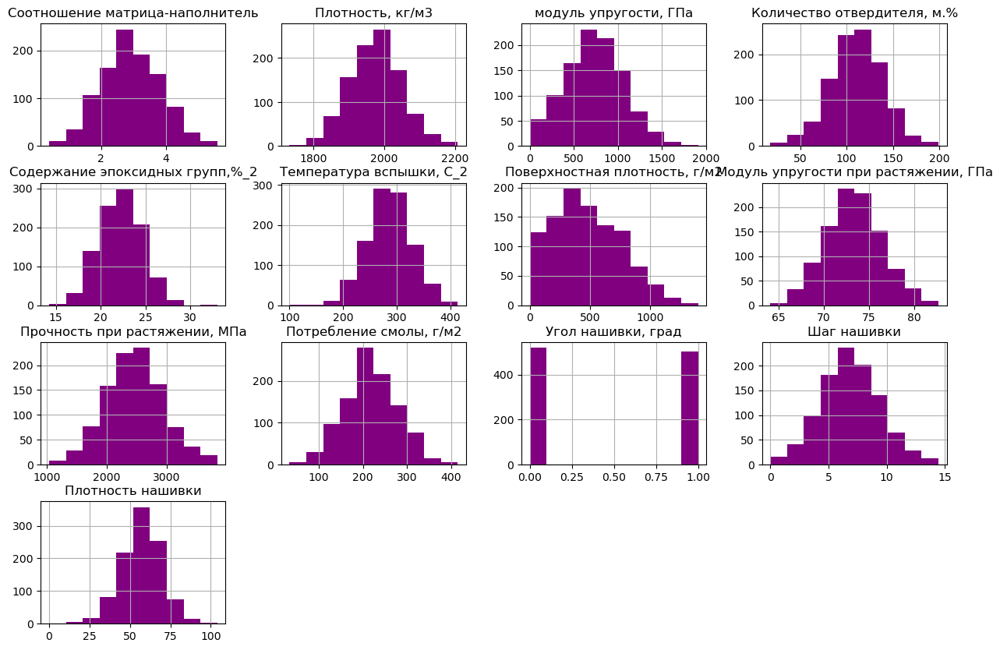

In [64]:
DataF1.hist(figsize = (15,10),color='purple')
plt.show()

In [65]:
#Гисторгамма распределения  с оценкой плотности ядра

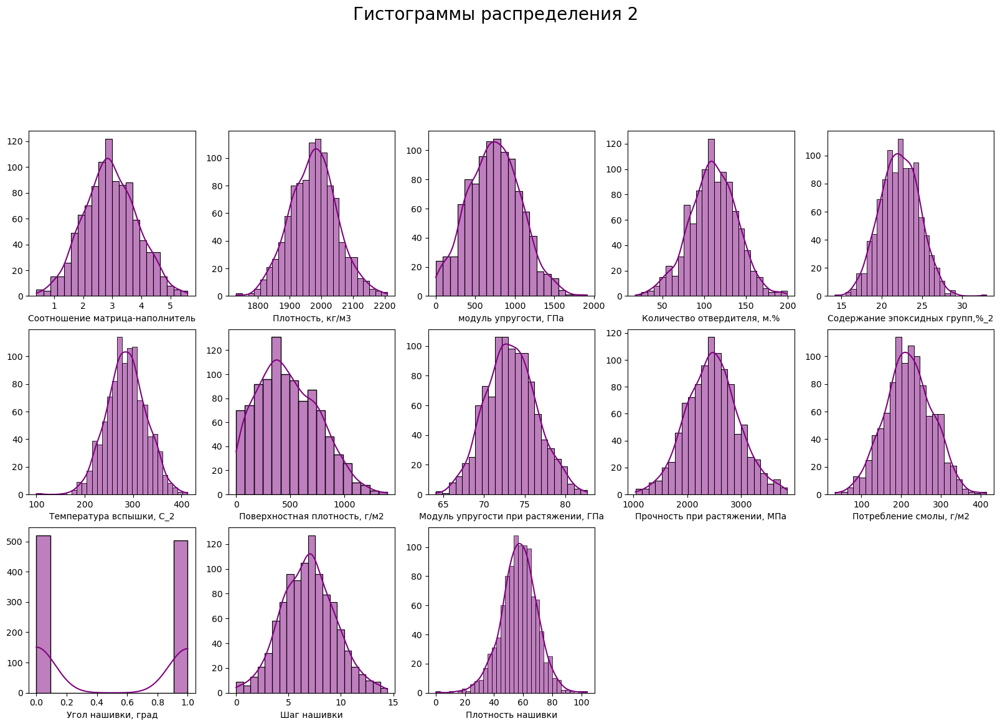

In [66]:
a = 5 #количество строк
b = 5 #количество столбцов
c = 1 
plt.figure(figsize = (20,20))
plt.suptitle('Гистограммы распределения 2', fontsize = 20)
for col in DataF1.columns:
    plt.subplot(a, b, c)
    sb.histplot(data = DataF1[col], kde=True, color='purple') 
    plt.ylabel(None)
    c += 1


In [67]:
#Гистограмма распределения 3, выбросы.

In [68]:
#Гистограмма распределения 3, выбросы.
for column in DataF1.columns:
    fig = px.histogram(DataF, x = column, nbins = 70, marginal = "box", template = "simple_white", color_discrete_sequence=["purple"])
    fig.show()

In [69]:
#Ящик с усами 1, выбросы.

In [70]:
for column in DataF1.columns: 
    fig = px.box(DataF, x=column, color_discrete_sequence=["purple"])
    fig.update_traces(marker=dict(color='purple'), boxpoints="outliers", jitter=0.3)
    fig.show()

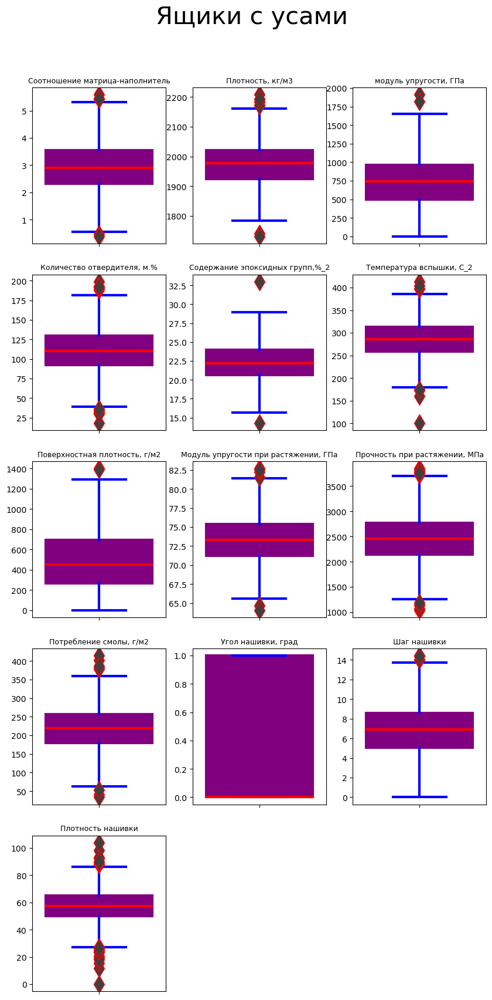

In [71]:
a = 5 # Строки
b = 3 # Столбцы
c = 1 # Плот

plt.figure(figsize=(10, 20))
plt.suptitle('Ящики с усами', y=0.95, fontsize=30)

for col in DataF1.columns:
    plt.subplot(a, b, c)
    sb.boxplot(data=DataF1, y=DataF1[col], fliersize=15, linewidth=3, medianprops=dict(color='r'),
               whiskerprops=dict(color='b'), capprops=dict(color='b'), flierprops=dict(color='r', markeredgecolor='r'),
               boxprops=dict(facecolor='purple', color='purple'))
    plt.ylabel(None)
    plt.title(col, size=0.9 * plt.rcParams['font.size'])
    c += 1

plt.show()

In [72]:
#Ящики с усами 4, выбросы, не соответствуют нормальному распределению Угол и Плотность

Соотношение матрица-наполнитель


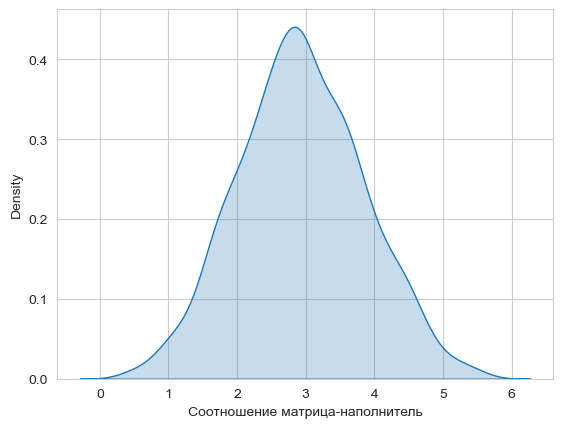

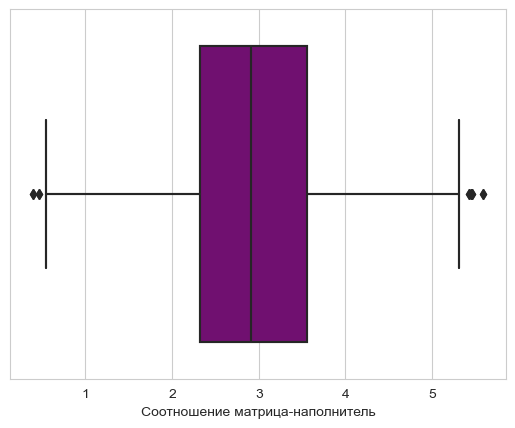

Минимальное значение:  0.389402605178414
Максимальное значение:  5.59174159869754
Среднее значение:  2.9303657734325483
Медианное значение:  2.90687765033521



Плотность, кг/м3


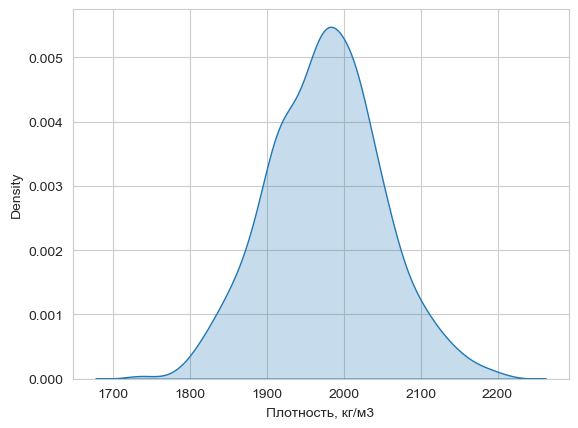

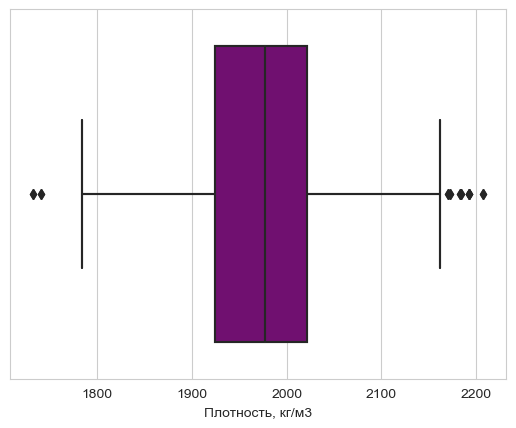

Минимальное значение:  1731.764635096
Максимальное значение:  2207.77348061119
Среднее значение:  1975.7348881101545
Медианное значение:  1977.62165679058



модуль упругости, ГПа


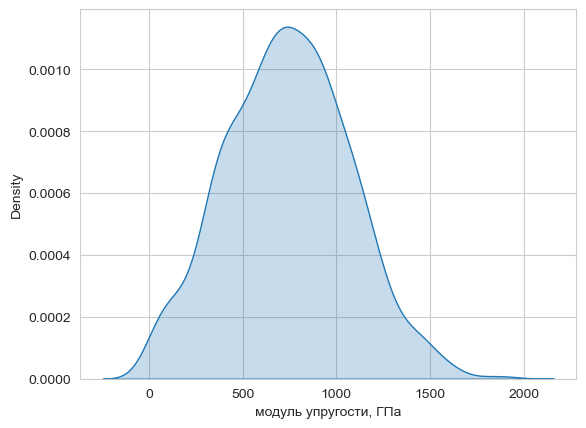

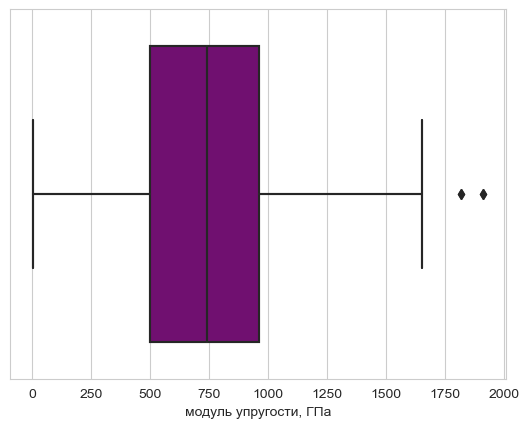

Минимальное значение:  2.4369087535075
Максимальное значение:  1911.53647700054
Среднее значение:  739.9232327560721
Медианное значение:  739.664327697792



Количество отвердителя, м.%


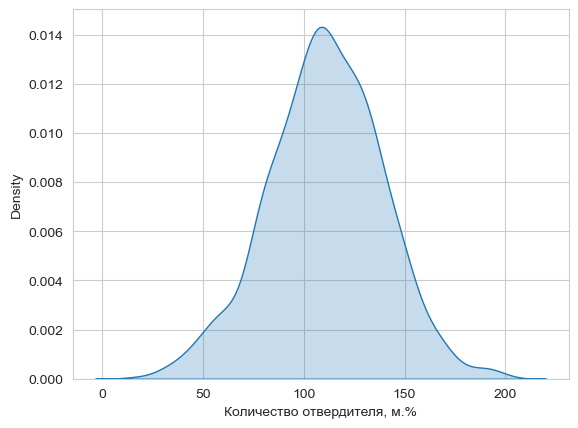

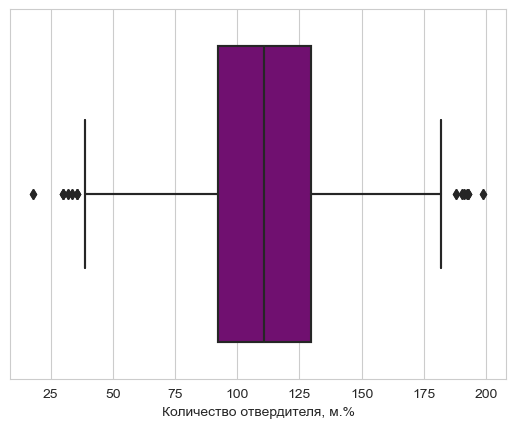

Минимальное значение:  17.7402745562519
Максимальное значение:  198.953207190451
Среднее значение:  110.57076864736254
Медианное значение:  110.564839894065



Содержание эпоксидных групп,%_2


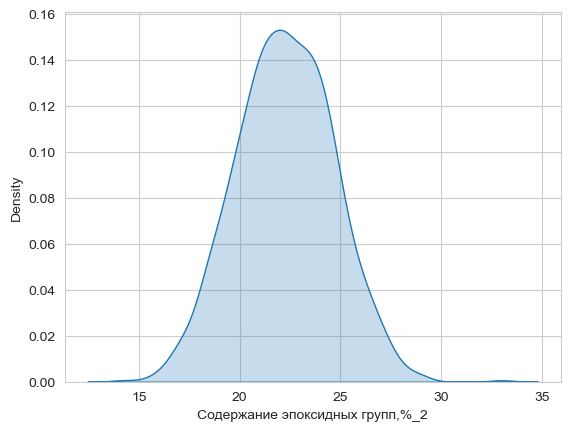

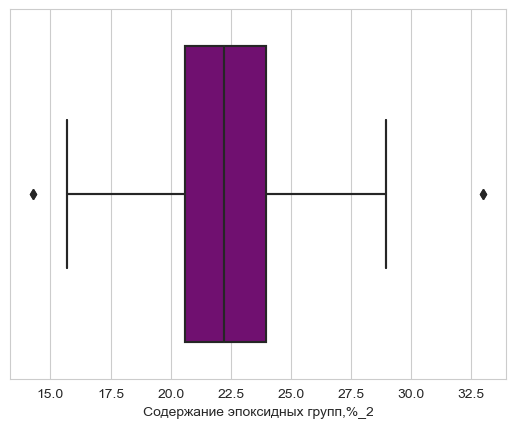

Минимальное значение:  14.2549854977161
Максимальное значение:  33.0
Среднее значение:  22.24438954776773
Медианное значение:  22.2307437560244



Температура вспышки, С_2


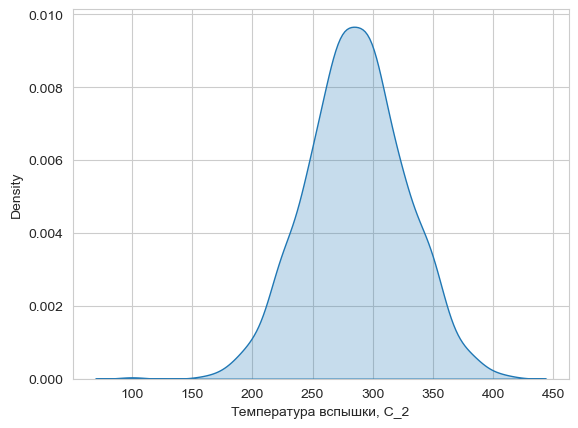

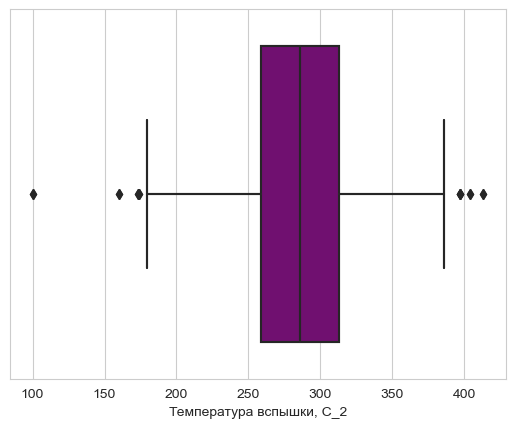

Минимальное значение:  100.0
Максимальное значение:  413.273418243566
Среднее значение:  285.88215135162187
Медианное значение:  285.896812331237



Поверхностная плотность, г/м2


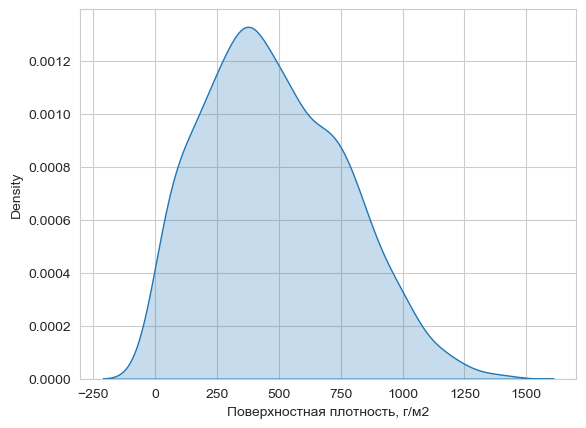

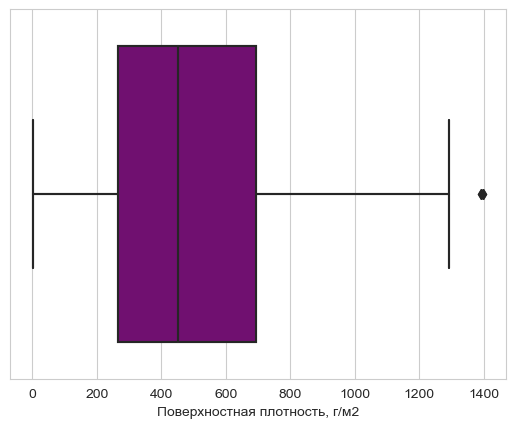

Минимальное значение:  0.603739925153945
Максимальное значение:  1399.54236233989
Среднее значение:  482.73183303841853
Медианное значение:  451.86436518306



Модуль упругости при растяжении, ГПа


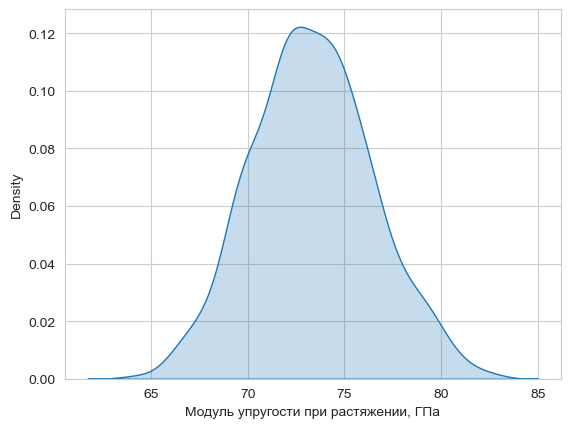

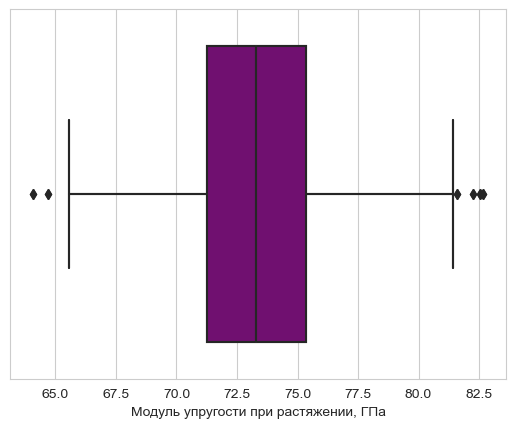

Минимальное значение:  64.0540605597917
Максимальное значение:  82.682051035271
Среднее значение:  73.32857125009068
Медианное значение:  73.2688045943481



Прочность при растяжении, МПа


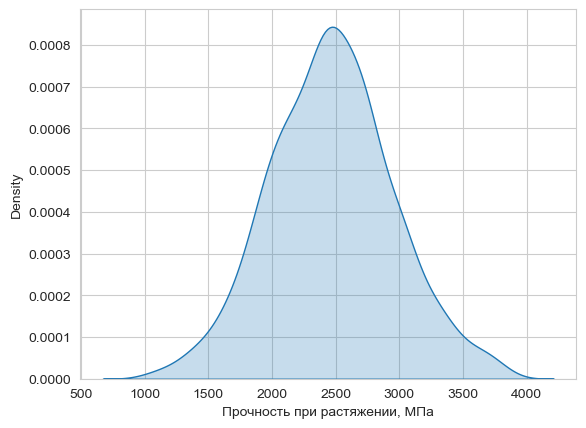

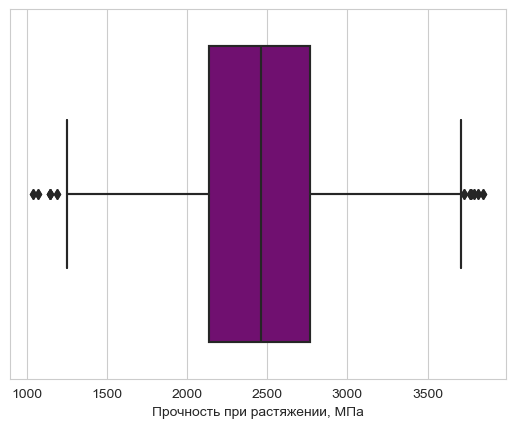

Минимальное значение:  1036.85660535
Максимальное значение:  3848.43673187618
Среднее значение:  2466.922842697902
Медианное значение:  2459.52452600309



Потребление смолы, г/м2


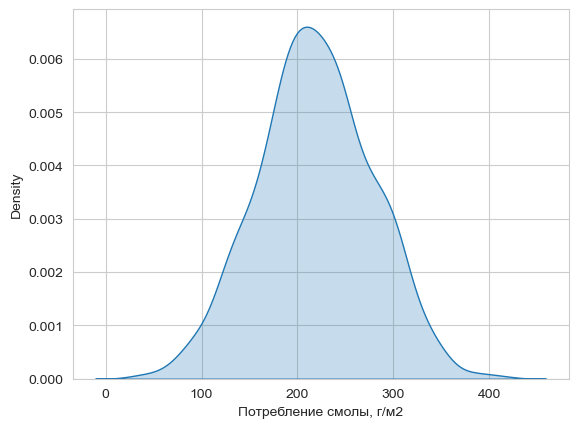

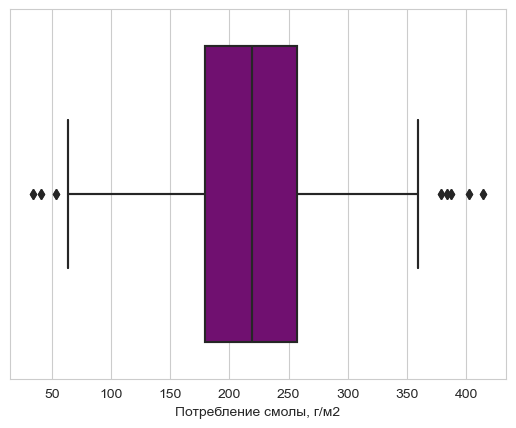

Минимальное значение:  33.8030255329625
Максимальное значение:  414.590628361534
Среднее значение:  218.42314367654285
Медианное значение:  219.198882195134



Угол нашивки, град


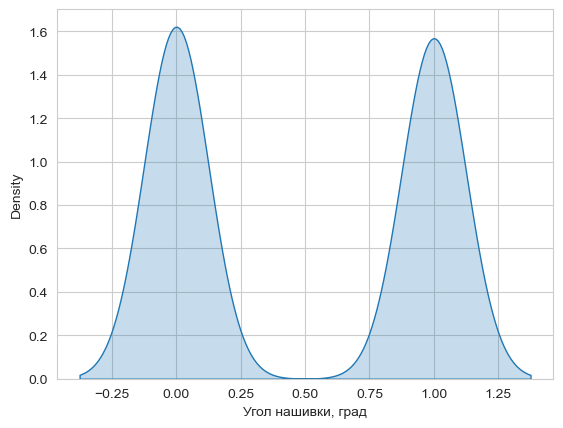

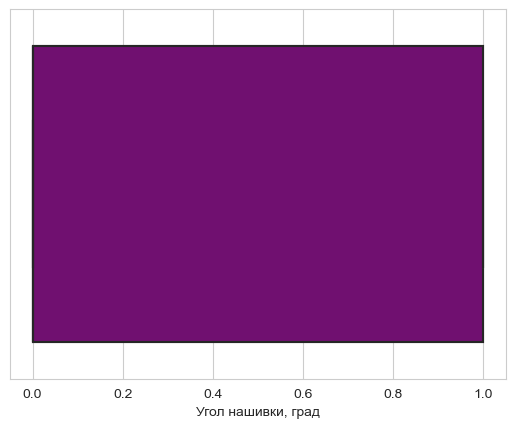

Минимальное значение:  0
Максимальное значение:  1
Среднее значение:  0.4916911045943304
Медианное значение:  0.0



Шаг нашивки


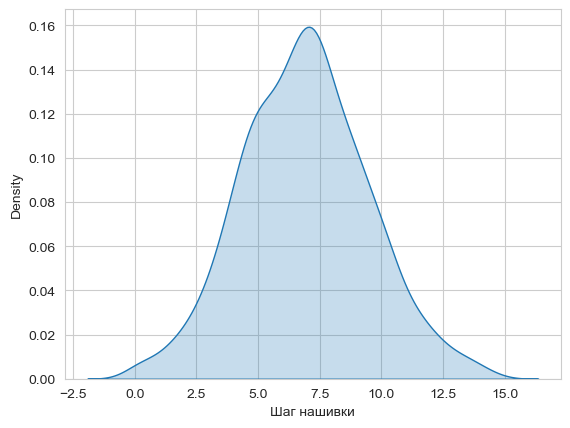

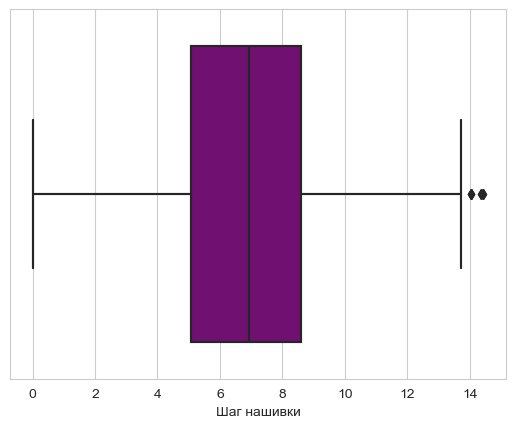

Минимальное значение:  0.0
Максимальное значение:  14.4405218753969
Среднее значение:  6.8992220776750175
Медианное значение:  6.9161438559491



Плотность нашивки


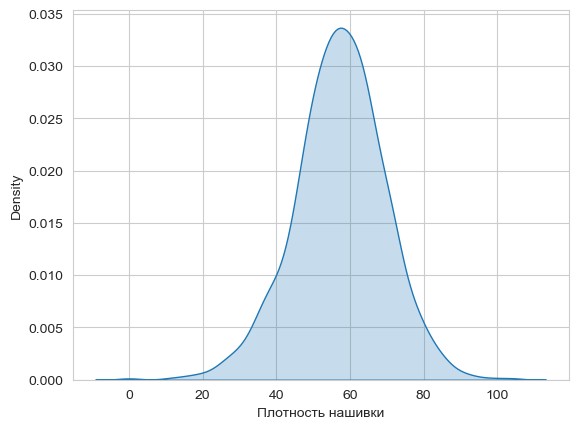

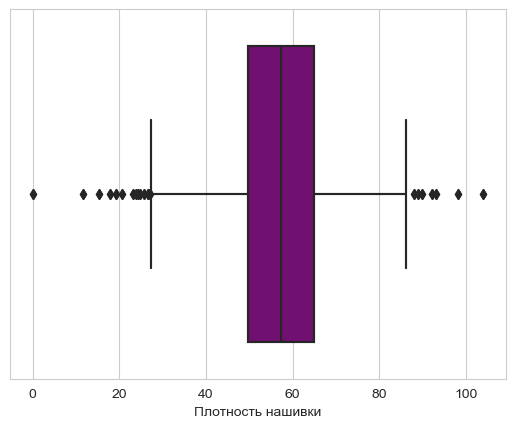

Минимальное значение:  0.0
Максимальное значение:  103.988901301494
Среднее значение:  57.153929432857645
Медианное значение:  57.3419198469929





In [73]:
for column_name in DataF1.columns:
    print(column_name)
    
    #Гистограмма распределения
    gis = DataF1[column_name]
    sb.set_style("whitegrid")
    sb.kdeplot(data = gis, fill = True)
    plt.show()
    
    #Диаграмма "Ящик с усами"
    sb.boxplot(x=gis);
    sb.boxplot(x=gis, color='purple')
    plt.show()
    
    #Значения
    print("Минимальное значение: ", end = " ")
    print(np.min(gis))
    print("Максимальное значение: ", end=" ")
    print(np.max(gis))
    print("Среднее значение: ", end = " ")
    print(np.mean(gis))
    print("Медианное значение: ", end = " ")
    print(np.median(gis))
    print("\n\n")

In [74]:
#Графики рассеяния точек 1

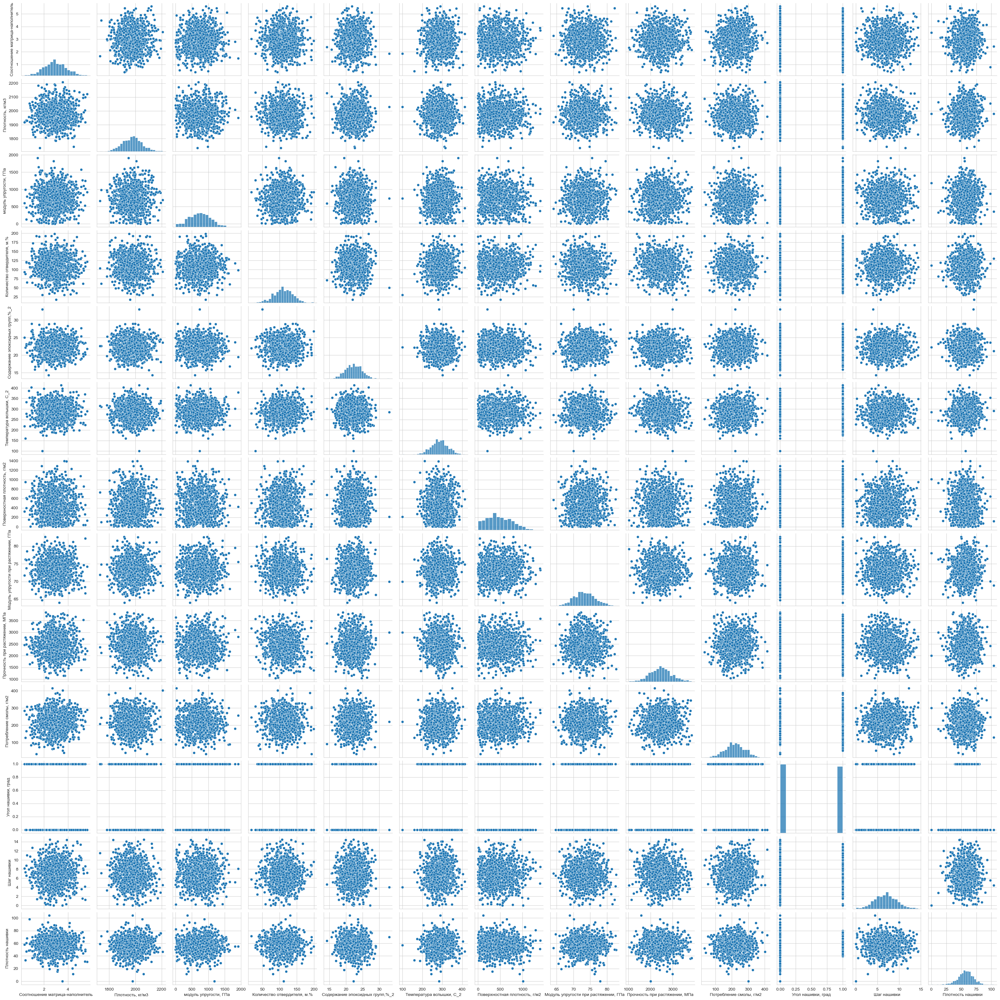

In [75]:
sb.pairplot(DataF1)#, hue = 'Угол нашивки, град', markers = ["o", "s"], diag_kind = 'auto', palette='RdBu')

In [76]:
#Графики рассеяния точек 2, зависимостей нет.

<function matplotlib.pyplot.show(close=None, block=None)>

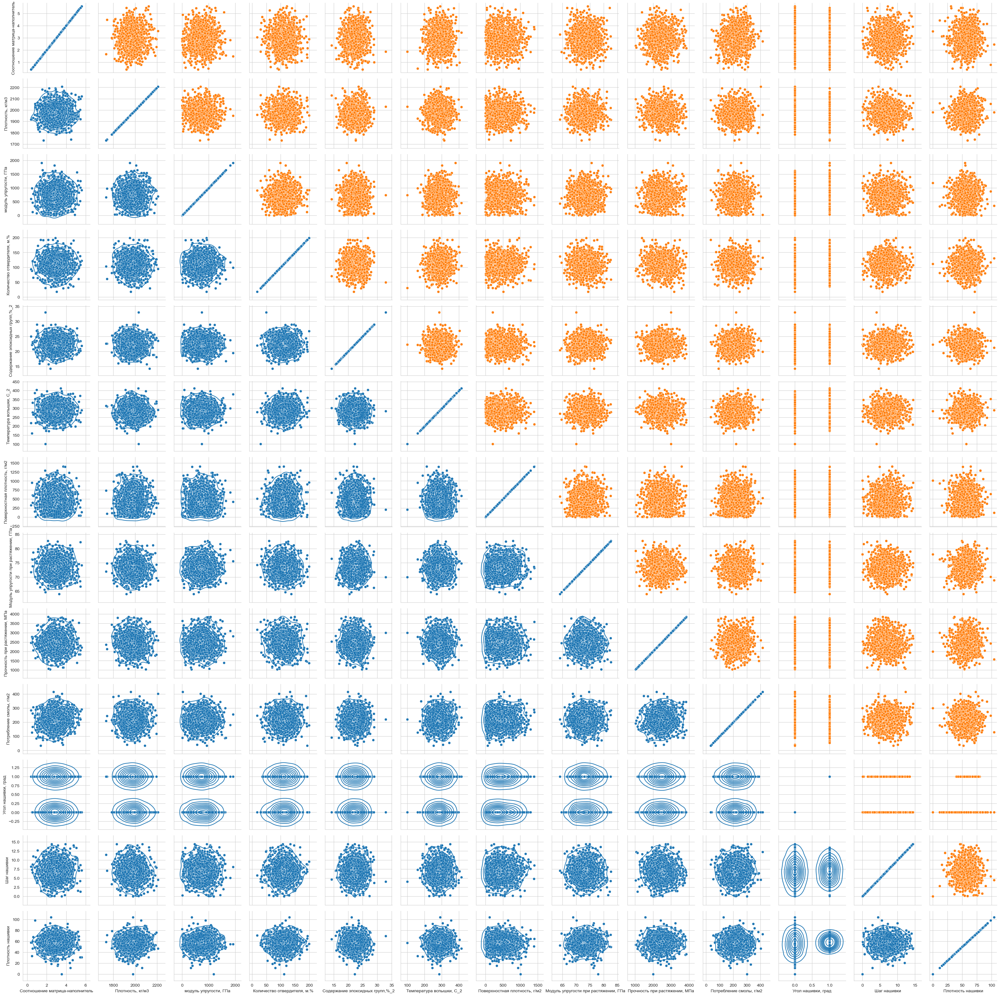

In [77]:
g = sb.PairGrid(DataF1[DataF1.columns])#,hue = 'Угол нашивки, град', palette='RdBu')
g.map(sb.scatterplot)
g.map_upper(sb.scatterplot)
g.map_lower(sb.kdeplot)
plt.show

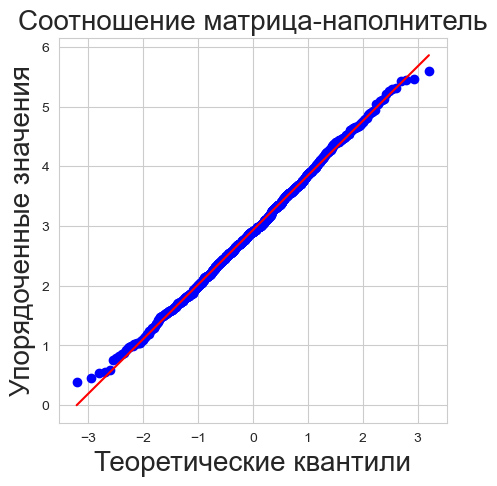

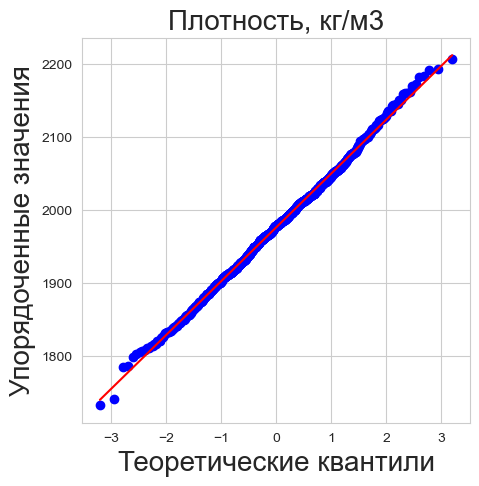

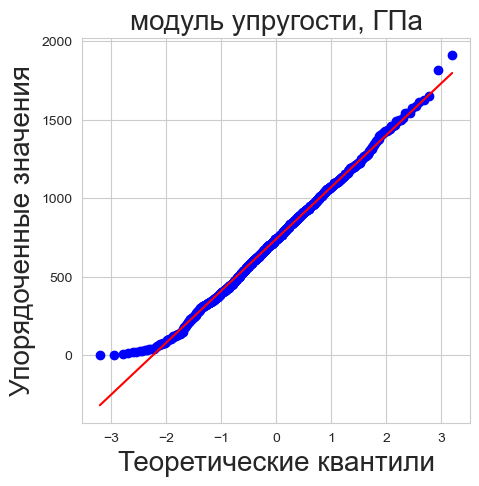

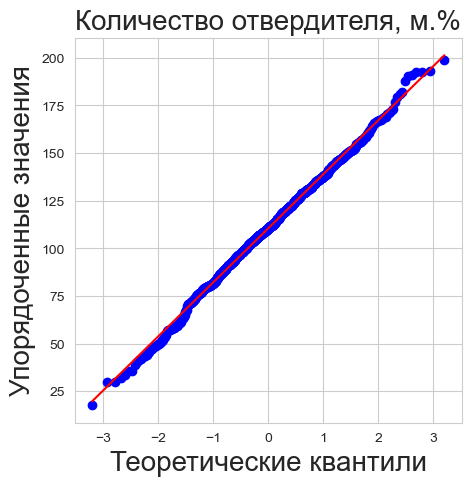

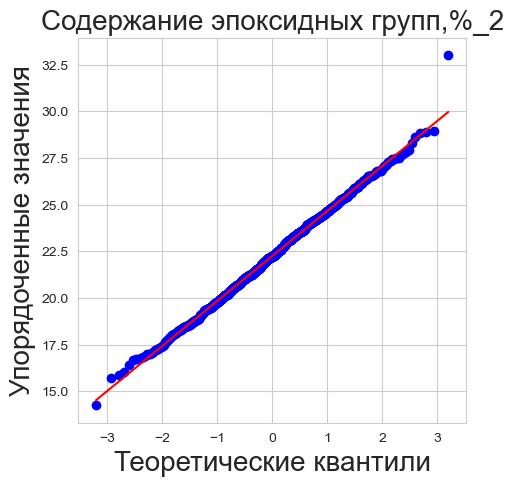

...

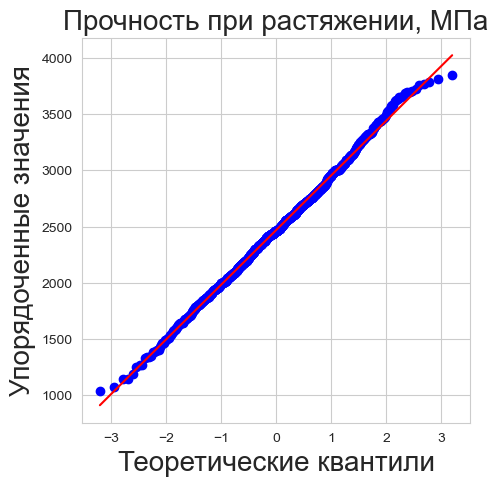

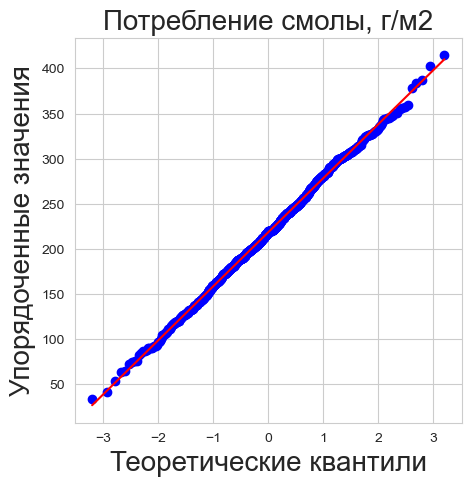

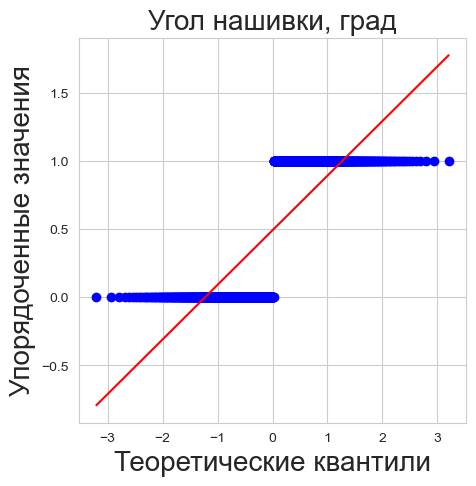

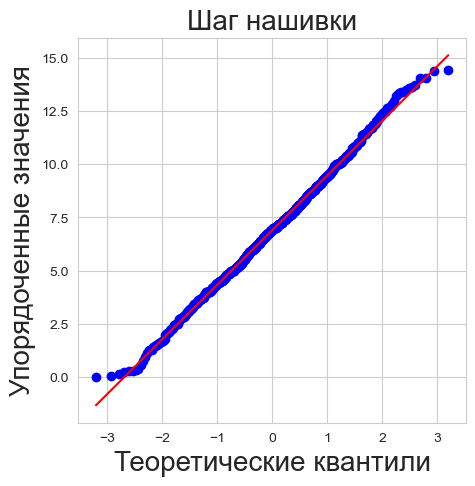

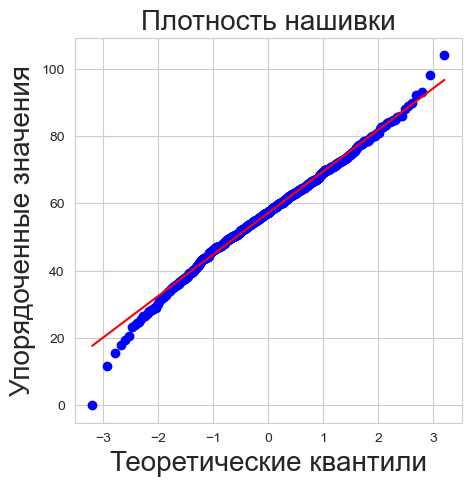

In [79]:
#График qq
for i in DataF1.columns:
    plt.figure(figsize = (5, 5))
    plt.rcParams['axes.prop_cycle'] = plt.cycler(color=['purple'])
    res = stats.probplot(DataF1[i], plot = plt)
    plt.title(i, fontsize = 20)
    plt.xlabel("Теоретические квантили", fontsize = 20)
    plt.ylabel("Упорядоченные значения", fontsize = 20)
    plt.show()

In [ ]:
#Тепловая карта

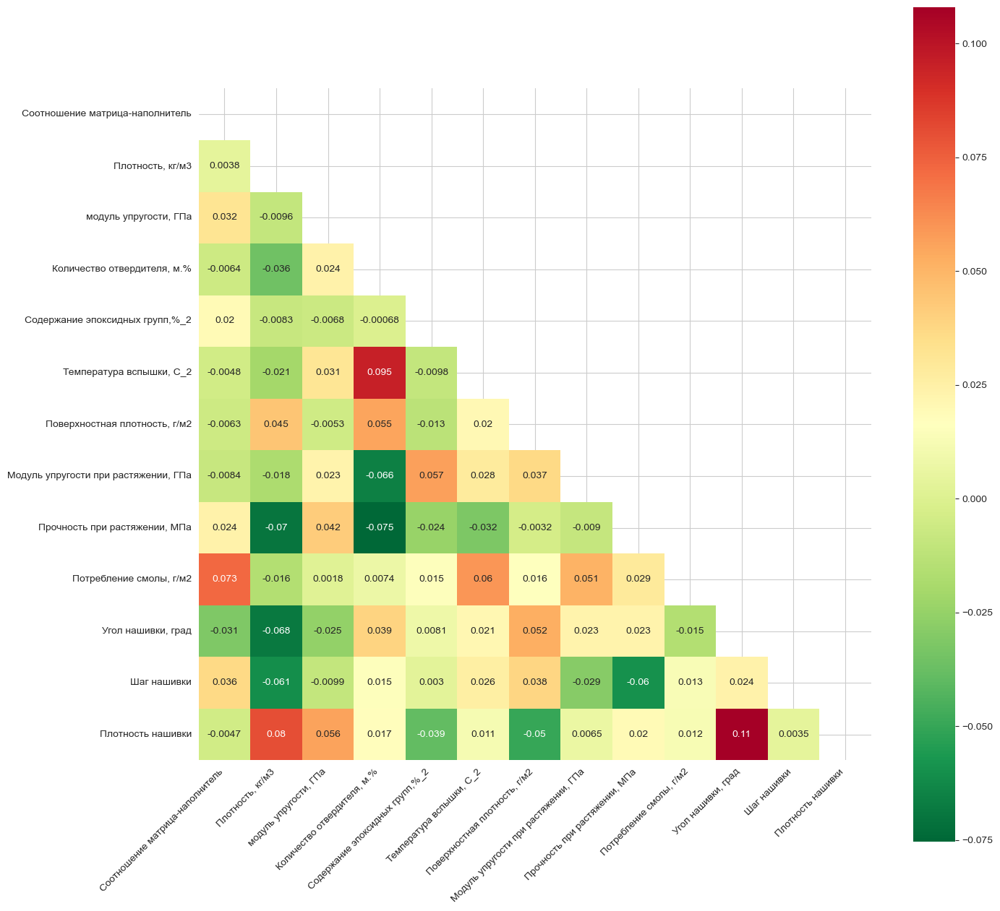

In [80]:
mask = np.triu(DataF1.corr())
f, ax = plt.subplots(figsize = (15, 15))
sb.heatmap(DataF1.corr(), mask = mask, annot = True, square = True, cmap = 'RdYlGn_r')
plt.xticks(rotation = 45, ha='right')
plt.show()

In [81]:
#подсчет количества пропущеных значений 

In [82]:
DataF1.isna().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [83]:
#Метод 3-х сигм для опредеония выбросов

In [84]:
metod_3s = 0
count_3s = []
for column in DataF:
    d = DataF.loc[:, [column]]
    zscore = (DataF[column] - DataF[column].mean()) / DataF[column].std()
    d['3s'] = zscore.abs() > 3
    metod_3s += d['3s'].sum()
    count_3s.append(d['3s'].sum())
    print(column,'3s', ': ', d['3s'].sum())

print('Метод 3-х сигм, выбросов:', metod_3s)

Соотношение матрица-наполнитель 3s :  0
Плотность, кг/м3 3s :  3
модуль упругости, ГПа 3s :  2
Количество отвердителя, м.% 3s :  2
Содержание эпоксидных групп,%_2 3s :  2
Температура вспышки, С_2 3s :  3
Поверхностная плотность, г/м2 3s :  2
Модуль упругости при растяжении, ГПа 3s :  0
Прочность при растяжении, МПа 3s :  0
Потребление смолы, г/м2 3s :  3
Угол нашивки, град 3s :  0
Шаг нашивки 3s :  0
Плотность нашивки 3s :  7
Метод 3-х сигм, выбросов: 24


In [85]:
#Межквартильне расстояния.Метод основан на квартилях распределния данных и более устойчив к выбросам чем метод 3-х сигм

In [86]:
metod_iq = 0
count_iq = []
for column in DataF1:
    d = DataF1.loc[:, [column]]
    q1 = np.quantile(DataF1[column], 0.25)
    q3 = np.quantile(DataF1[column], 0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    d['iq'] = (DataF1[column] <= lower) | (DataF1[column] >= upper)
    metod_iq += d['iq'].sum()
    count_iq.append(d['iq'].sum())
    print(column, ': ', d['iq'].sum())
print('Метод межквартильных расстояний, выбросов:', metod_iq)

Соотношение матрица-наполнитель :  6
Плотность, кг/м3 :  9
модуль упругости, ГПа :  2
Количество отвердителя, м.% :  14
Содержание эпоксидных групп,%_2 :  2
Температура вспышки, С_2 :  8
Поверхностная плотность, г/м2 :  2
Модуль упругости при растяжении, ГПа :  6
Прочность при растяжении, МПа :  11
Потребление смолы, г/м2 :  8
Угол нашивки, град :  0
Шаг нашивки :  4
Плотность нашивки :  21
Метод межквартильных расстояний, выбросов: 93


In [87]:
#Чистка выбросов, 1.5 межквартальных размахов, выбор в пользу количества удаляемых выбросов

In [88]:
drop = ["Соотношение матрица-наполнитель",
                 "Плотность, кг/м3",
                 "модуль упругости, ГПа",
                 "Количество отвердителя, м.%",
                 "Содержание эпоксидных групп,%_2",
                 "Температура вспышки, С_2",
                 "Поверхностная плотность, г/м2",
                 "Модуль упругости при растяжении, ГПа",
                 "Прочность при растяжении, МПа",
                 "Потребление смолы, г/м2",
                 "Шаг нашивки",
                 "Плотность нашивки"]

for i in drop:
    q75, q25 = np.percentile(DataF1.loc[:,i], [75,25])
    intr_qr = q75 - q25
    max = q75 + (1.5 * intr_qr)
    min = q25 - (1.5 * intr_qr)
    DataF1.loc[DataF1[i] < min, i] = np.nan
    DataF1.loc[DataF1[i] > max, i] = np.nan

DataF1 = DataF1.dropna(axis=0)
DataF1.shape

(936, 13)

In [89]:
DataF1.info()#Информация о датасете после удаления выбросов

<class 'pandas.core.frame.DataFrame'>
Int64Index: 936 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Угол нашивки, град                    936 non-null    int32  
 11  Шаг нашивки       

In [91]:
#Выполнение несколько раз, до тех пор пока шейп не перестанет изменяться.
for i in drop:
    q75, q25 = np.percentile(DataF1.loc[:,i], [75,25])
    intr_qr = q75 - q25
    max = q75 + (1.5 * intr_qr)
    min = q25 - (1.5 * intr_qr)
    DataF1.loc[DataF1[i] < min, i] = np.nan
    DataF1.loc[DataF1[i] > max, i] = np.nan

DataF1 = DataF1.dropna(axis=0)
DataF1.shape

(922, 13)

In [92]:
DataF1.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 922 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       922 non-null    float64
 1   Плотность, кг/м3                      922 non-null    float64
 2   модуль упругости, ГПа                 922 non-null    float64
 3   Количество отвердителя, м.%           922 non-null    float64
 4   Содержание эпоксидных групп,%_2       922 non-null    float64
 5   Температура вспышки, С_2              922 non-null    float64
 6   Поверхностная плотность, г/м2         922 non-null    float64
 7   Модуль упругости при растяжении, ГПа  922 non-null    float64
 8   Прочность при растяжении, МПа         922 non-null    float64
 9   Потребление смолы, г/м2               922 non-null    float64
 10  Угол нашивки, град                    922 non-null    int32  
 11  Шаг нашивки       

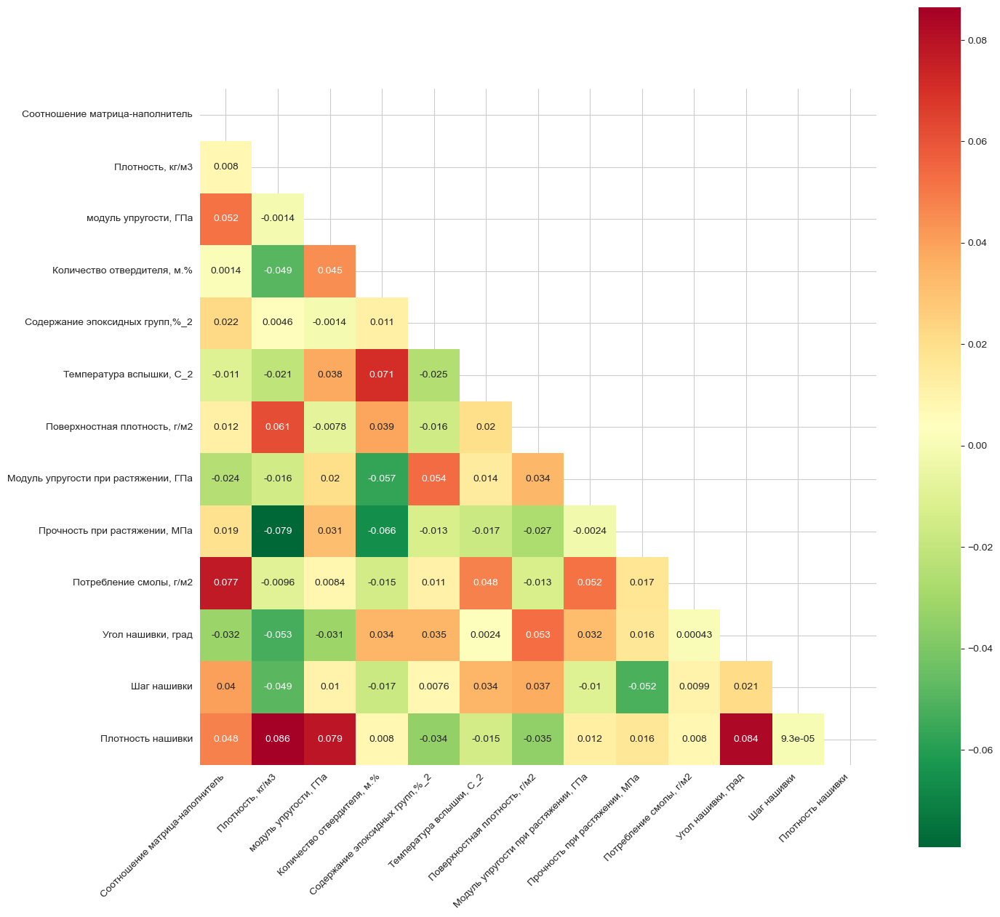

In [93]:
#Тепловая карта 
mask = np.triu(DataF1.corr())
f, ax = plt.subplots(figsize = (15, 15))
sb.heatmap(DataF1.corr(), mask = mask, annot = True, square = True, cmap = 'RdYlGn_r')
plt.xticks(rotation = 45, ha='right')
plt.show()
#Самая большая зависимость между Плостностью и углом нашивки но и она н

In [95]:
#Сохранение чистого датасета
DataF1.to_excel('C:/ESD/X_clean.xlsx')